# car sound

1. check the wave plot
2. check the spectrogram
3. listen to the audio inside jn

## detection technique: autocorrelation


In [16]:
%matplotlib inline
import librosa
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd

In [17]:
x, sr = librosa.load('car_passing.wav')
# x is the length of the audio array and sr is the sample rate

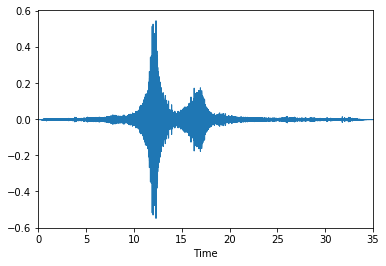

In [36]:
librosa.display.waveplot(x, sr=sr)

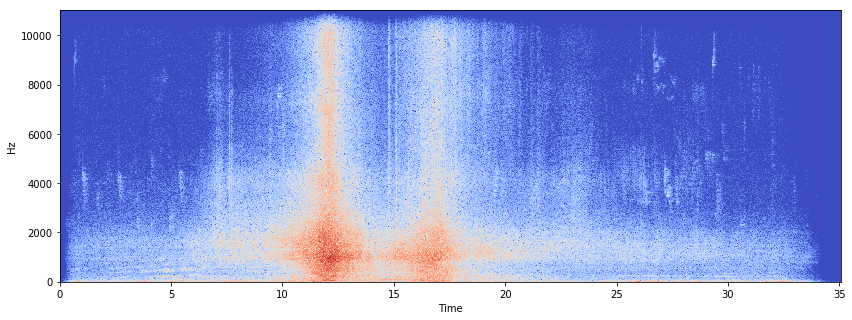

In [19]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')

In [20]:
ipd.Audio('car_passing.wav')

# Signal detection technique: autocorrelation
1. for acoustic transient signal in noisy environment
2. goal is to identify the reflection

The autocorrelation is used to find how similar a signal, or function, is to itself at a certain time difference. At a time difference of 0, the auto-correlation should be the **highest** because the signal is identical to itself, so you expected that the first element in the autocorrelation result array would be the greatest. 

The autocorrelation is useful for finding repeated patterns in a signal. For example, at short lags, the autocorrelation can tell us something about the signal's fundamental frequency. For longer lags, the autocorrelation may tell us something about the tempo of signal.


Text(0.5,0,'Lag (samples)')

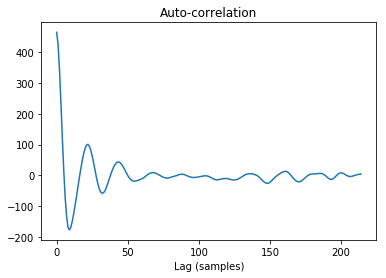

In [37]:
#using numpy autocorr = np.correlate(x, x, mode='full')
# Because the autocorrelation produces a symmetric signal, we only care about the "right half".
#r = np.correlate(x, x, mode='full')[len(x)-1:]
#print(x.shape, r.shape)
#plt.figure(figsize=(14, 5))
#plt.plot(r[:1000])
#plt.xlabel('Lag (samples)')


# using librosa
#maximum correlation lag
lag = 5 #s
ac = librosa.autocorrelate(x, max_size = lag * sr / 512)
#plt.figure(figsize=(14, 5))
plt.plot(ac)
plt.title('Auto-correlation')
plt.xlabel('Lag (samples)')

The autocorrelation always has a **maximum at zero**, i.e. zero lag. We want to identify the maximum outside of the peak centered at zero. Therefore, we might choose only to search within a range of reasonable pitches: